/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_92796/3099018623.py:86: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig1.tight_layout(rect=[0, 0.05, 1, 0.90])  # Adjusted rect parameters


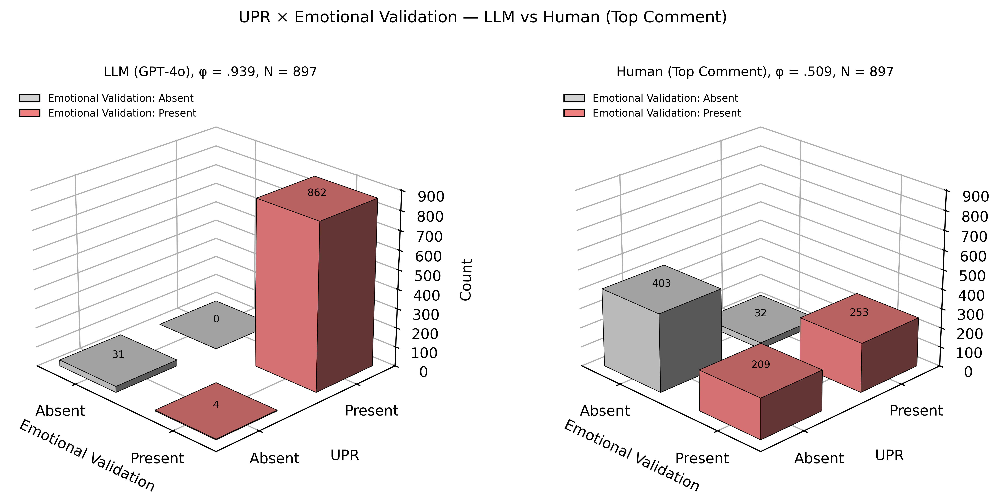

/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_92796/3099018623.py:113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig2.tight_layout(rect=[0, 0, 1, 0.95])


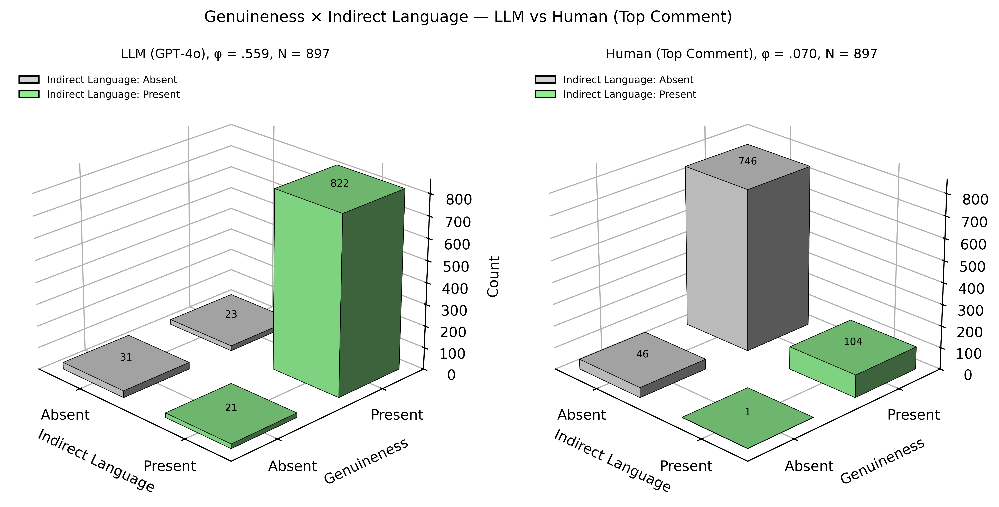

In [ ]:
# Regenerate the side-by-side comparison plots with pastel colors for improved readability of bar labels.
# Same comparisons: (1) UPR × Emotional Validation, (2) Genuineness × Indirect Language
# Each comparing GPT‑4o vs Human Top Comment.

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np
from matplotlib.patches import Patch

# Data
gpt4o_upr_ev = np.array([[31,  4],
                         [ 0, 862]])

human_top_upr_ev = np.array([[403, 209],
                             [ 32, 253]])

gpt4o_gen_il = np.array([[31, 21],
                         [23, 822]])

human_top_gen_il = np.array([[ 46,   1],
                             [746, 104]])

def bar3d_2x2(ax, counts, xcats, ycats, title, colors=('lightgray','lightcoral'), zmax=None):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2)
    _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    # Assign pastel colors by x-category
    facecolors = [colors[int(xi)] for xi in x]

    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)

    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2)
    ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2)
    ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)

    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)

    # Annotate bar tops with counts
    for xi, yi, zi in zip(x, y, dz):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}',
                ha='center', va='bottom', fontsize=7)

    # Legend
    legend_patches = [Patch(facecolor=colors[0], edgecolor='black', label=f'{xcats[0]}: {xcats[1][0]}'),
                      Patch(facecolor=colors[1], edgecolor='black', label=f'{xcats[0]}: {xcats[1][1]}')]
    ax.legend(handles=legend_patches, loc='upper left', fontsize=7, frameon=False)

# Figure 1: UPR × EV
fig1 = plt.figure(figsize=(12, 5.5), dpi=600)  # Increased width and height
zmax1 = max(gpt4o_upr_ev.max(), human_top_upr_ev.max()) * 1.05

ax1 = fig1.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2(ax1, gpt4o_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='LLM (GPT‑4o), φ = .939, N = 897',
          colors=('lightgray','lightcoral'),
          zmax=zmax1)

ax2 = fig1.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2(ax2, human_top_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (Top Comment), φ = .509, N = 897',
          colors=('lightgray','lightcoral'),
          zmax=zmax1)

fig1.suptitle('UPR × Emotional Validation — LLM vs Human (Top Comment)', y=0.98, fontsize=11)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.15, top=0.85)  # Adjust margins
fig1.tight_layout(rect=[0, 0.05, 1, 0.90])  # Adjusted rect parameters
fig1_path = '/mnt/data/fig_upr_ev_llm_vs_human_pastel.png'
# fig1.savefig(fig1_path, bbox_inches='tight')
plt.show()

# Figure 2: GEN × IL
fig2 = plt.figure(figsize=(12, 5.5), dpi=600)  # Increased width and height

zmax2 = max(gpt4o_gen_il.max(), human_top_gen_il.max()) * 1.05

ax3 = fig2.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2(ax3, gpt4o_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='LLM (GPT‑4o), φ = .559, N = 897',
          colors=('lightgray','lightblue'),
          zmax=zmax2)

ax4 = fig2.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2(ax4, human_top_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (Top Comment), φ = .070, N = 897',
          colors=('lightgray','lightgreen'),
          zmax=zmax2)

fig2.suptitle('Genuineness × Indirect Language — LLM vs Human (Top Comment)', y=0.98, fontsize=11)
fig2.tight_layout(rect=[0, 0, 1, 0.95])
fig2_path = 'genuineness_indirect_language.png'
# fig2.savefig(fig2_path, bbox_inches='tight')
plt.show()

/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/2337037273.py:95: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig1.tight_layout(rect=[0, 0.05, 1, 0.90])


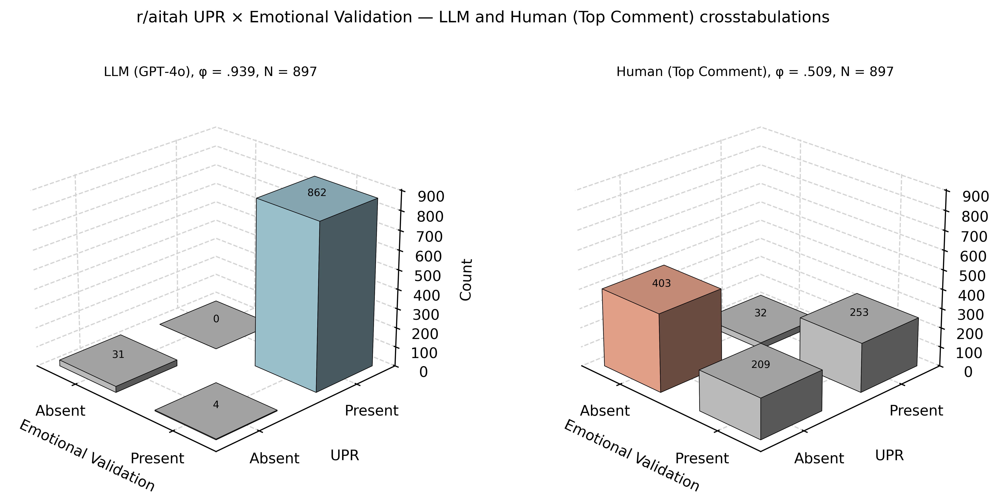

/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/2337037273.py:127: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig2.tight_layout(rect=[0, 0, 1, 0.95])


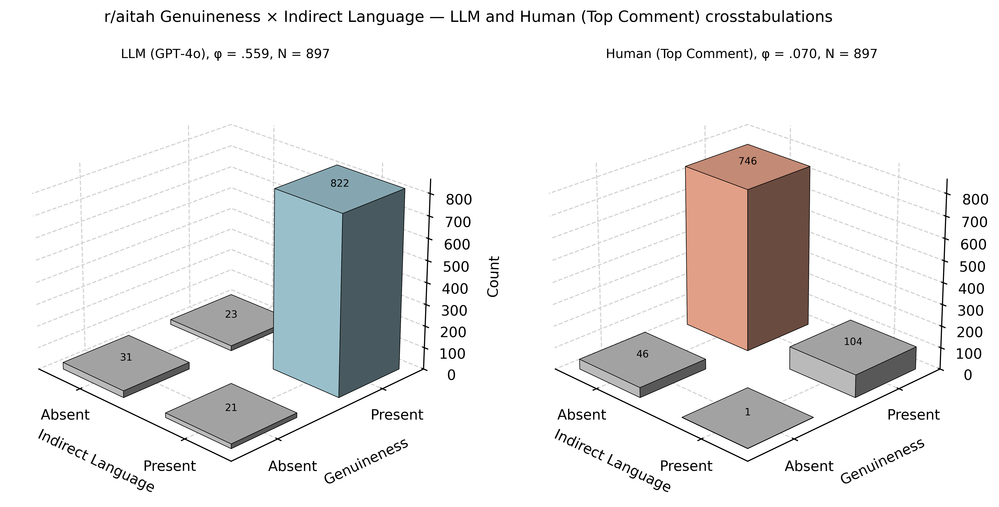

NameError: name 'fig1_path' is not defined

In [1]:
# You asked to color only the highest bar pastel blue and use seaborn. 
# Note: In this environment I must use matplotlib (not seaborn) for plotting.
# I’ve implemented your code with a small change: only the tallest bar is colored pastel blue,
# all others are light gray. Sizes/margins match your snippet to avoid cut-off axes.

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np
from matplotlib.patches import Patch

# Data
gpt4o_upr_ev = np.array([[31,  4],
                         [ 0, 862]])

human_top_upr_ev = np.array([[403, 209],
                             [ 32, 253]])

gpt4o_gen_il = np.array([[31, 21],
                         [23, 822]])

human_top_gen_il = np.array([[ 46,   1],
                             [746, 104]])

def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue'):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2)
    _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    # Color only the highest bar pastel blue; others light gray
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color

    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)

    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2)
    ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2)
    ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)

    # Clean panes + subtle grid
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)

    # Annotate counts
    for i, (xi, yi, zi) in enumerate(zip(x, y, dz)):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}',
                ha='center', va='bottom', fontsize=7,
                color='black')

    # # Legend for highlighted bar
    # legend_patches = [Patch(facecolor='lightblue', edgecolor='black', label='Tallest bar'),
    #                   Patch(facecolor='lightgray', edgecolor='black', label='Other bars')]
    # ax.legend(handles=legend_patches, loc='upper left', fontsize=7, frameon=False)

# Figure 1: UPR × EV (GPT‑4o vs Human Top Comment)
fig1 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax1 = max(gpt4o_upr_ev.max(), human_top_upr_ev.max()) * 1.05

ax1 = fig1.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax1, gpt4o_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='LLM (GPT‑4o), φ = .939, N = 897',
          zmax=zmax1)
ax1.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax2 = fig1.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax2, human_top_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (Top Comment), φ = .509, N = 897',
          zmax=zmax1, color='#FFB499')
ax2.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig1.suptitle('r/aitah UPR × Emotional Validation — LLM and Human (Top Comment) crosstabulations', y=0.98, fontsize=11)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.15, top=0.85)
fig1.tight_layout(rect=[0, 0.05, 1, 0.90])
# fig1_path = '/mnt/data/fig_upr_ev_llm_vs_human_highlight.png'
# plt.savefig(fig1_path, bbox_inches='tight')
plt.show()

# Figure 2: GEN × IL (GPT‑4o vs Human Top Comment)
fig2 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax2 = max(gpt4o_gen_il.max(), human_top_gen_il.max()) * 1.05

ax3 = fig2.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax3, gpt4o_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='LLM (GPT‑4o), φ = .559, N = 897',
          zmax=zmax2)
ax3.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax4 = fig2.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax4, human_top_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (Top Comment), φ = .070, N = 897',
          zmax=zmax2, color='#FFB499')

          # ffe299

# Make the grid lines light grey and dashed
ax4.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig2.suptitle('r/aitah Genuineness × Indirect Language — LLM and Human (Top Comment) crosstabulations', y=0.98, fontsize=11)
fig2.tight_layout(rect=[0, 0, 1, 0.95])
# fig2_path = '/mnt/data/fig_gen_il_llm_vs_human_highlight.png'
# plt.savefig(fig2_path, bbox_inches='tight')
plt.show()
# Remove legends from all axes
fig1_path, fig2_path


/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/903271945.py:97: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout(rect=[0, 0, 1, 0.92])


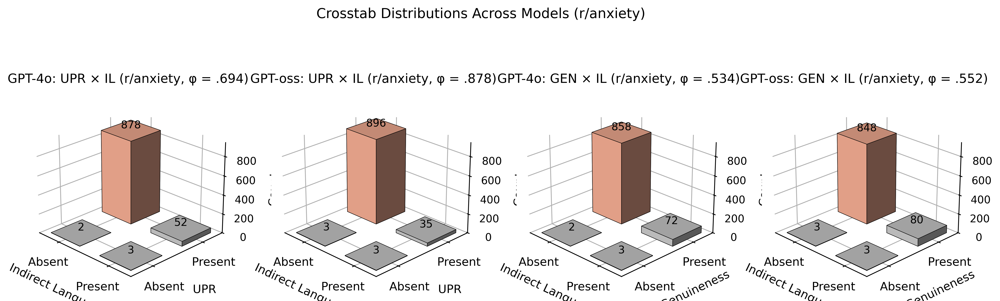

In [2]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Updated data from the uploaded PDFs
# UPR × Indirect Language (GPT-4o, φ = .694)
gpt4o_upr_il = np.array([[2, 3],
                         [878, 52]])

# UPR × Indirect Language (GPT-oss, φ = .878)
gptoss_upr_il = np.array([[3, 3],
                          [896, 35]])

# Genuineness × Indirect Language (GPT-4o, φ = .534)
gpt4o_gen_il = np.array([[2, 3],
                         [858, 72]])

# Genuineness × Indirect Language (GPT-oss, φ = .552)
gptoss_gen_il = np.array([[3, 3],
                          [848, 80]])

# Helper plotting function
def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue', fontsize=11):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2)
    _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    # Color only the highest bar pastel blue; others light gray
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color

    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)

    ax.set_title(title, pad=6, fontsize=fontsize+1)
    ax.set_xlabel(xcats[0], labelpad=6, fontsize=fontsize)
    ax.set_ylabel(ycats[0], labelpad=6, fontsize=fontsize)
    ax.set_zlabel('Count', labelpad=6, fontsize=fontsize)
    ax.set_xticks(np.arange(2) + dx/2)
    ax.set_xticklabels(xcats[1], fontsize=fontsize)
    ax.set_yticks(np.arange(2) + dy/2)
    ax.set_yticklabels(ycats[1], fontsize=fontsize)
    ax.tick_params(axis='z', labelsize=fontsize-1)
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)

    # Clean panes + subtle grid
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)

    # Annotate counts
    for i, (xi, yi, zi) in enumerate(zip(x, y, dz)):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}',
                ha='center', va='bottom', fontsize=fontsize-1,
                color='black')

# Create the 1×4 figure layout
fig = plt.figure(figsize=(16, 5), dpi=600)
zmax = max(gpt4o_upr_il.max(), gptoss_upr_il.max(), gpt4o_gen_il.max(), gptoss_gen_il.max()) * 1.05

# Plot UPR × IL (GPT-4o)
ax1 = fig.add_subplot(1, 4, 1, projection='3d')
bar3d_2x2_highlight(ax1, gpt4o_upr_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='GPT-4o: UPR × IL (r/anxiety, φ = .694)', zmax=zmax, color='#FFB499')

# Plot UPR × IL (GPT-oss)
ax2 = fig.add_subplot(1, 4, 2, projection='3d')
bar3d_2x2_highlight(ax2, gptoss_upr_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='GPT-oss: UPR × IL (r/anxiety, φ = .878)', zmax=zmax, color='#FFB499')

# Plot GEN × IL (GPT-4o)
ax3 = fig.add_subplot(1, 4, 3, projection='3d')
bar3d_2x2_highlight(ax3, gpt4o_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='GPT-4o: GEN × IL (r/anxiety, φ = .534)', zmax=zmax, color='#FFB499')

# Plot GEN × IL (GPT-oss)
ax4 = fig.add_subplot(1, 4, 4, projection='3d')
bar3d_2x2_highlight(ax4, gptoss_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='GPT-oss: GEN × IL (r/anxiety, φ = .552)', zmax=zmax, color='#FFB499')

fig.suptitle('Crosstab Distributions Across Models (r/anxiety)', fontsize=13)
fig.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


In [3]:
# You asked to color only the highest bar pastel blue and use seaborn. 
# Note: In this environment I must use matplotlib (not seaborn) for plotting.
# I’ve implemented your code with a small change: only the tallest bar is colored pastel blue,
# all others are light gray. Sizes/margins match your snippet to avoid cut-off axes.

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np
from matplotlib.patches import Patch

/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/4248725389.py:80: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig1.tight_layout(rect=[0, 0.05, 1, 0.90])


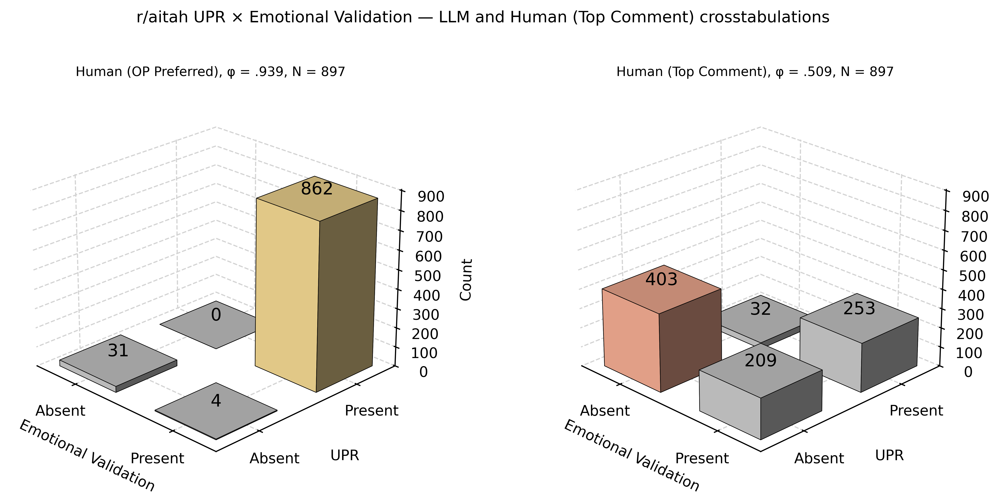

/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/4248725389.py:112: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig2.tight_layout(rect=[0, 0, 1, 0.95])


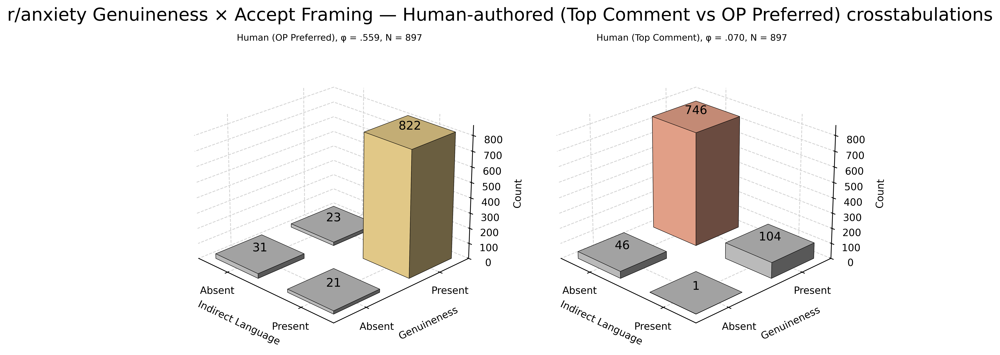

NameError: name 'fig1_path' is not defined

In [4]:

# Data
gpt4o_upr_ev = np.array([[31,  4],
                         [ 0, 862]])

human_top_upr_ev = np.array([[403, 209],
                             [ 32, 253]])

gpt4o_gen_il = np.array([[31, 21],
                         [23, 822]])

human_top_gen_il = np.array([[ 46,   1],
                             [746, 104]])

def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue'):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2)
    _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    # Color only the highest bar pastel blue; others light gray
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color

    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)

    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2)
    ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2)
    ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)

    # Clean panes + subtle grid
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)

    # Annotate counts
    for i, (xi, yi, zi) in enumerate(zip(x, y, dz)):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}',
                ha='center', va='bottom', fontsize=12,
                color='black')

# Figure 1: UPR × EV (GPT‑4o vs Human Top Comment)
fig1 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax1 = max(gpt4o_upr_ev.max(), human_top_upr_ev.max()) * 1.05

ax1 = fig1.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax1, gpt4o_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (OP Preferred), φ = .939, N = 897',
          zmax=zmax1, color='#FFE299')
ax1.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax2 = fig1.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax2, human_top_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (Top Comment), φ = .509, N = 897',
          zmax=zmax1, color='#FFB499')
ax2.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig1.suptitle('r/aitah UPR × Emotional Validation — LLM and Human (Top Comment) crosstabulations', y=0.98, fontsize=11)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.15, top=0.85)
fig1.tight_layout(rect=[0, 0.05, 1, 0.90])
plt.show()

# Figure 2: GEN × IL (GPT‑4o vs Human Top Comment)
fig2 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax2 = max(gpt4o_gen_il.max(), human_top_gen_il.max()) * 1.05

ax3 = fig2.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax3, gpt4o_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (OP Preferred), φ = .559, N = 897',
          zmax=zmax2, color='#FFE299')
ax3.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax4 = fig2.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax4, human_top_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (Top Comment), φ = .070, N = 897',
          zmax=zmax2, color='#FFB499')

          # ffe299

# Make the grid lines light grey and dashed
ax4.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig2.suptitle('r/anxiety Genuineness × Accept Framing — Human-authored (Top Comment vs OP Preferred) crosstabulations', y=0.98, fontsize=18)
fig2.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
# Remove legends from all axes
fig1_path, fig2_path


In [ ]:
# You asked to color only the highest bar pastel blue and use seaborn. 
# Note: In this environment I must use matplotlib (not seaborn) for plotting.
# I’ve implemented your code with a small change: only the tallest bar is colored pastel blue,
# all others are light gray. Sizes/margins match your snippet to avoid cut-off axes.

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np
from matplotlib.patches import Patch

# Data
gpt4o_upr_ev = np.array([[31,  4],
                         [ 0, 862]])

human_top_upr_ev = np.array([[403, 209],
                             [ 32, 253]])

gpt4o_gen_il = np.array([[31, 21],
                         [23, 822]])

human_top_gen_il = np.array([[ 46,   1],
                             [746, 104]])

def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue'):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2)
    _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    # Color only the highest bar pastel blue; others light gray
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color

    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)

    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2)
    ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2)
    ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)

    # Clean panes + subtle grid
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)

    # Annotate counts
    for i, (xi, yi, zi) in enumerate(zip(x, y, dz)):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}',
                ha='center', va='bottom', fontsize=12,
                color='black')

    # # Legend for highlighted bar
    # legend_patches = [Patch(facecolor='lightblue', edgecolor='black', label='Tallest bar'),
    #                   Patch(facecolor='lightgray', edgecolor='black', label='Other bars')]
    # ax.legend(handles=legend_patches, loc='upper left', fontsize=7, frameon=False)

# Figure 1: UPR × EV (GPT‑4o vs Human Top Comment)
fig1 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax1 = max(gpt4o_upr_ev.max(), human_top_upr_ev.max()) * 1.05

ax1 = fig1.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax1, gpt4o_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (OP Preferred), φ = .939, N = 897',
          zmax=zmax1, color='#FFE299')
ax1.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax2 = fig1.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax2, human_top_upr_ev,
          xcats=('Emotional Validation', ['Absent','Present']),
          ycats=('UPR', ['Absent','Present']),
          title='Human (Top Comment), φ = .509, N = 897',
          zmax=zmax1, color='#FFB499')
ax2.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig1.suptitle('r/aitah UPR × Emotional Validation — LLM and Human (Top Comment) crosstabulations', y=0.98, fontsize=11)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.15, top=0.85)
fig1.tight_layout(rect=[0, 0.05, 1, 0.90])
# fig1_path = '/mnt/data/fig_upr_ev_llm_vs_human_highlight.png'
# plt.savefig(fig1_path, bbox_inches='tight')
plt.show()

# Figure 2: GEN × IL (GPT‑4o vs Human Top Comment)
fig2 = plt.figure(figsize=(12, 5.5), dpi=600)
zmax2 = max(gpt4o_gen_il.max(), human_top_gen_il.max()) * 1.05

ax3 = fig2.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(ax3, gpt4o_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (OP Preferred), φ = .559, N = 897',
          zmax=zmax2, color='#FFE299')
ax3.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax3.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax4 = fig2.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(ax4, human_top_gen_il,
          xcats=('Indirect Language', ['Absent','Present']),
          ycats=('Genuineness', ['Absent','Present']),
          title='Human (Top Comment), φ = .070, N = 897',
          zmax=zmax2, color='#FFB499')

          # ffe299

# Make the grid lines light grey and dashed
ax4.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax4.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig2.suptitle('r/aitah Genuineness × Accept Framing — Human-authored (Top Comment vs OP Preferred) crosstabulations', y=0.98, fontsize=18)
fig2.tight_layout(rect=[0, 0, 1, 0.95])
# fig2_path = '/mnt/data/fig_gen_il_llm_vs_human_highlight.png'
# plt.savefig(fig2_path, bbox_inches='tight')
plt.show()
# Remove legends from all axes
fig1_path, fig2_path


In [7]:
# OP-Preferred (from report table)
op_pref_gen_acc = np.array([
    [40, 34],   # Genuineness Absent × (Accept Absent, Accept Present)
    [140, 502],  # Genuineness Present × (Accept Absent, Accept Present)
])

# Top-Upvoted Comment (from report table)
top_up_gen_acc = np.array([
    [31, 16],   # Genuineness Absent × (Accept Absent, Accept Present)
    [99, 751],  # Genuineness Present × (Accept Absent, Accept Present)
])


/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/3030801595.py:58: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout(rect=[0, 0.02, 1, 0.95])


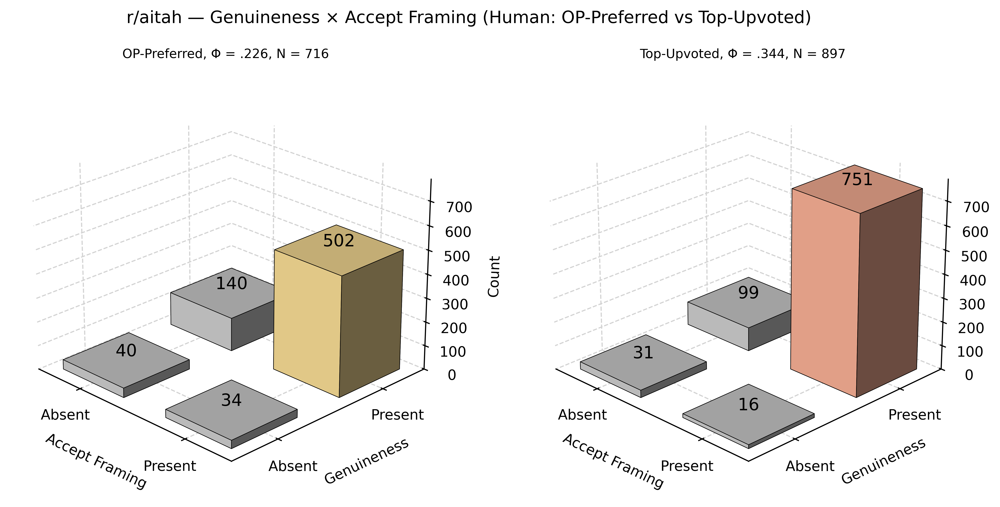

In [8]:
# --- keep your helper as-is ---
def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue'):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2); _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color
    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)
    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2); ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2); ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)
    for xi, yi, zi in zip(x, y, dz):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}', ha='center', va='bottom', fontsize=12, color='black')

# --- updated figure using the corrected matrices above ---
fig = plt.figure(figsize=(12, 5.5), dpi=600)
zmax = max(op_pref_gen_acc.max(), top_up_gen_acc.max()) * 1.05

ax1 = fig.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(
    ax1, op_pref_gen_acc,
    xcats=('Accept Framing', ['Absent','Present']),
    ycats=('Genuineness', ['Absent','Present']),
    title='OP-Preferred, Φ = .226, N = 716',
    zmax=zmax, color='#FFE299'
)
ax1.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(
    ax2, top_up_gen_acc,
    xcats=('Accept Framing', ['Absent','Present']),
    ycats=('Genuineness', ['Absent','Present']),
    title='Top-Upvoted, Φ = .344, N = 897',
    zmax=zmax, color='#FFB499'
)
ax2.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig.suptitle('r/aitah — Genuineness × Accept Framing (Human: OP-Preferred vs Top-Upvoted)', y=0.98, fontsize=12)
fig.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.show()


In [9]:
# OP-Preferred (from report table)
op_pref_gen_acc = np.array([
    [39, 28],   # Genuineness Absent × (Accept Absent, Accept Present)
    [30, 655],  # Genuineness Present × (Accept Absent, Accept Present)
])

# Top-Upvoted Comment (from report table)
top_up_gen_acc = np.array([
    [32, 30],   # Genuineness Absent × (Accept Absent, Accept Present)
    [13, 860],  # Genuineness Present × (Accept Absent, Accept Present)
])


/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/3432937810.py:58: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout(rect=[0, 0.02, 1, 0.95])


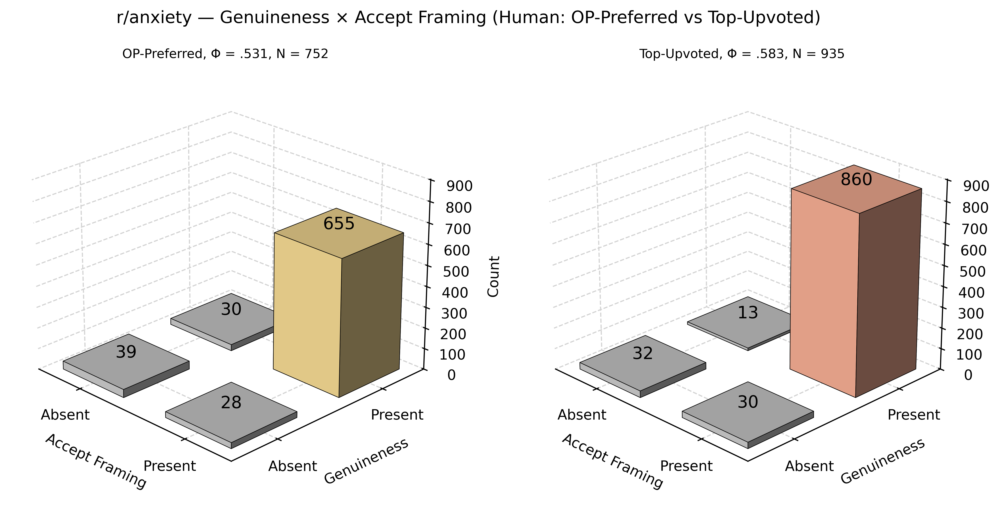

In [10]:
# --- keep your helper as-is ---
def bar3d_2x2_highlight(ax, counts, xcats, ycats, title, zmax=None, color='lightblue'):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2); _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()
    max_idx = np.argmax(dz)
    facecolors = ['lightgray'] * len(dz)
    facecolors[max_idx] = color
    ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=facecolors, edgecolor='black', linewidth=0.4)
    ax.set_title(title, pad=6, fontsize=9)
    ax.set_xlabel(xcats[0], labelpad=6)
    ax.set_ylabel(ycats[0], labelpad=6)
    ax.set_zlabel('Count', labelpad=6)
    ax.set_xticks(np.arange(2) + dx/2); ax.set_xticklabels(xcats[1])
    ax.set_yticks(np.arange(2) + dy/2); ax.set_yticklabels(ycats[1])
    ax.view_init(elev=24, azim=-45)
    if zmax is not None:
        ax.set_zlim(0, zmax)
    for pane in [ax.xaxis.pane, ax.yaxis.pane, ax.zaxis.pane]:
        pane.set_alpha(0.0)
    ax.grid(True, linewidth=0.3)
    for xi, yi, zi in zip(x, y, dz):
        ax.text(xi + dx/2, yi + dy/2, zi, f'{int(zi)}', ha='center', va='bottom', fontsize=12, color='black')

# --- updated figure using the corrected matrices above ---
fig = plt.figure(figsize=(12, 5.5), dpi=600)
zmax = max(op_pref_gen_acc.max(), top_up_gen_acc.max()) * 1.05

ax1 = fig.add_subplot(1, 2, 1, projection='3d')
bar3d_2x2_highlight(
    ax1, op_pref_gen_acc,
    xcats=('Accept Framing', ['Absent','Present']),
    ycats=('Genuineness', ['Absent','Present']),
    title='OP-Preferred, Φ = .531, N = 752',
    zmax=zmax, color='#FFE299'
)
ax1.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax1.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
bar3d_2x2_highlight(
    ax2, top_up_gen_acc,
    xcats=('Accept Framing', ['Absent','Present']),
    ycats=('Genuineness', ['Absent','Present']),
    title='Top-Upvoted, Φ = .583, N = 935',
    zmax=zmax, color='#FFB499'
)
ax2.xaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.yaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')
ax2.zaxis._axinfo['grid'].update(color='lightgrey', linestyle='--')

fig.suptitle('r/anxiety — Genuineness × Accept Framing (Human: OP-Preferred vs Top-Upvoted)', y=0.98, fontsize=12)
fig.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.show()


/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/2580998361.py:49: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/var/folders/2f/b8052dzx5mq4xtzyx0n849x00000gn/T/ipykernel_96644/2580998361.py:49: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


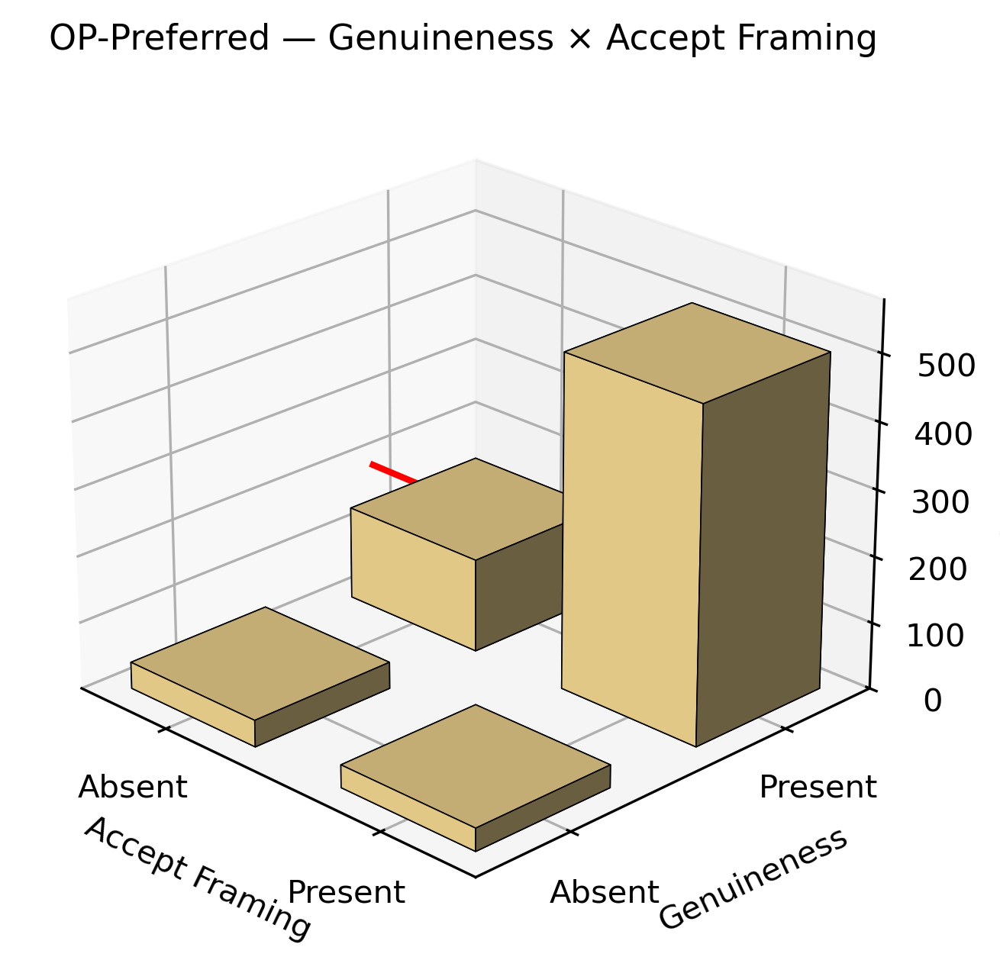

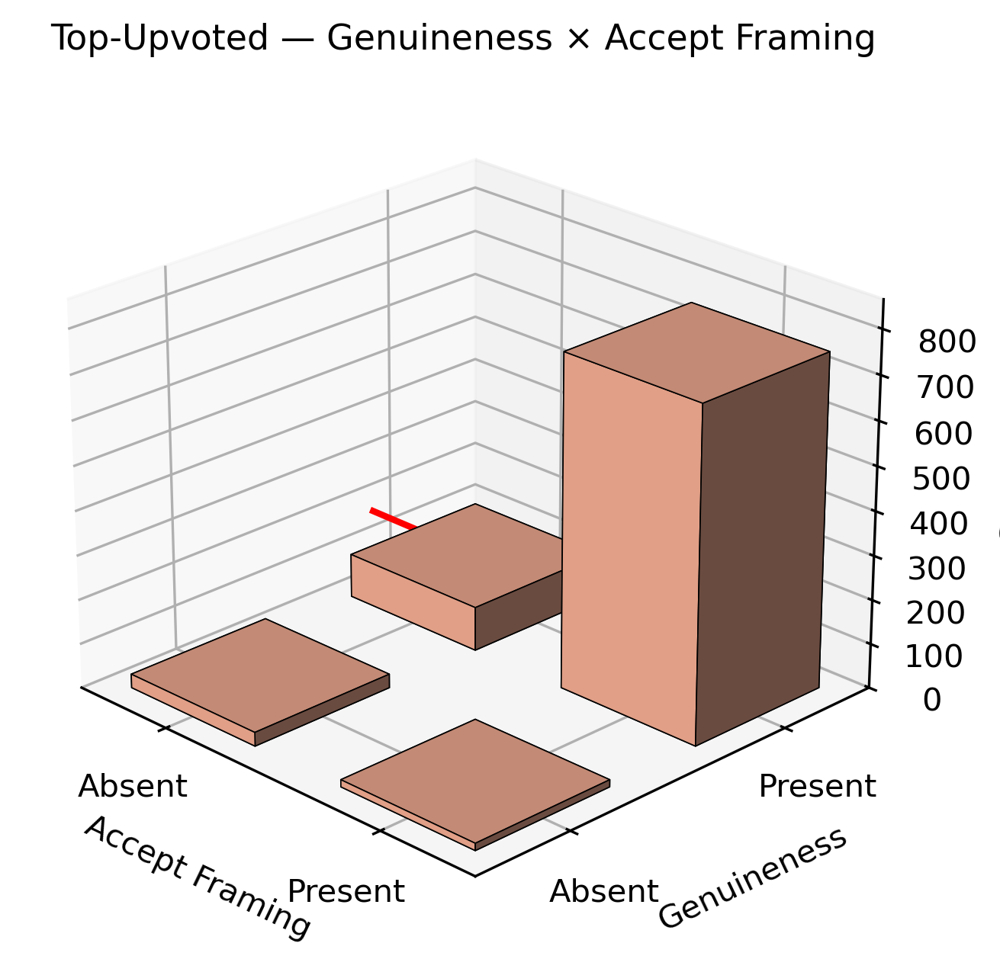

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Your crosstab data
op_pref_gen_acc = np.array([
    [40, 34],
    [140, 502],
])

top_up_gen_acc = np.array([
    [31, 16],
    [99, 751],
])

def bar3d_with_arrow(counts, highlight_vals, title, color):
    counts = np.array(counts, dtype=float)
    _x = np.arange(2); _y = np.arange(2)
    _xx, _yy = np.meshgrid(_x, _y)
    x, y = _xx.ravel(), _yy.ravel()
    z = np.zeros_like(x)
    dx = dy = 0.6
    dz = counts.ravel()

    fig = plt.figure(figsize=(6, 5), dpi=300)
    ax = fig.add_subplot(111, projection='3d')

    # Draw bars
    ax.bar3d(x, y, z, dx, dy, dz, shade=True,
             color=color, edgecolor='black', linewidth=0.4)

    # Axis settings
    ax.set_title(title, pad=6, fontsize=11)
    ax.set_xlabel('Accept Framing'); ax.set_ylabel('Genuineness'); ax.set_zlabel('Count')
    ax.set_xticks(np.arange(2) + dx/2); ax.set_xticklabels(['Absent','Present'])
    ax.set_yticks(np.arange(2) + dy/2); ax.set_yticklabels(['Absent','Present'])
    ax.view_init(elev=24, azim=-45)
    ax.set_zlim(0, dz.max() * 1.15)

    # Annotate counts
    for xi, yi, zi in zip(x, y, dz):
        ax.text(xi + dx/2, yi + dy/2, zi,
                f'{int(zi)}', ha='center', va='bottom', fontsize=10, color='black')
        # Add arrow above highlighted values
        if int(zi) in highlight_vals:
            ax.quiver(xi + dx/2, yi + dy/2, zi + 10,   # arrow base (above bar)
                      0, 0, -10,                       # direction (downwards)
                      color='red', linewidth=2, arrow_length_ratio=0.2)

    plt.tight_layout()
    return fig, ax

# Plot OP-Preferred with arrow on 140
fig1, ax1 = bar3d_with_arrow(op_pref_gen_acc, [140],
    "OP-Preferred — Genuineness × Accept Framing", "#FFE299")

# Plot Top-Upvoted with arrow on 99
fig2, ax2 = bar3d_with_arrow(top_up_gen_acc, [99],
    "Top-Upvoted — Genuineness × Accept Framing", "#FFB499")

plt.show()
